In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Problemstatement.txt
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/354-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/340-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/333-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/335-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/355-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/326-inputs.png
/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thick/dataset/valid/input/343-inpu

In [2]:
from os import listdir
from numpy import asarray
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from numpy import savez_compressed

In [3]:
from os import listdir
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from numpy import asarray
from numpy import savez_compressed

# load all images in a directory into memory
def load_images(path, size=(256,256)):
    data_list = list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # store
        data_list.append(pixels)
    return asarray(data_list)

# dataset paths
haze_path = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/'
dehaze_path = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/'
# load dataset haze
dataA_train = load_images(haze_path + 'train/input/')
dataA_test = load_images(haze_path + 'test/input/')
dataA_valid = load_images(haze_path + 'valid/input/')
# load dataset dehaze
dataB_train = load_images(dehaze_path + 'train/target/')
dataB_test = load_images(dehaze_path + 'test/target/')
dataB_valid = load_images(dehaze_path + 'valid/target/')

# save as compressed numpy array
filename = 'Haze_DeHaze_256.npz'
savez_compressed(filename, dataA_train, dataA_test, dataA_valid, dataB_train, dataB_test, dataB_valid)
print('Saved dataset: ', filename)

Saved dataset:  Haze_DeHaze_256.npz


Loaded:  (320, 256, 256, 3) (45, 256, 256, 3) (35, 256, 256, 3) (320, 256, 256, 3) (45, 256, 256, 3) (35, 256, 256, 3)


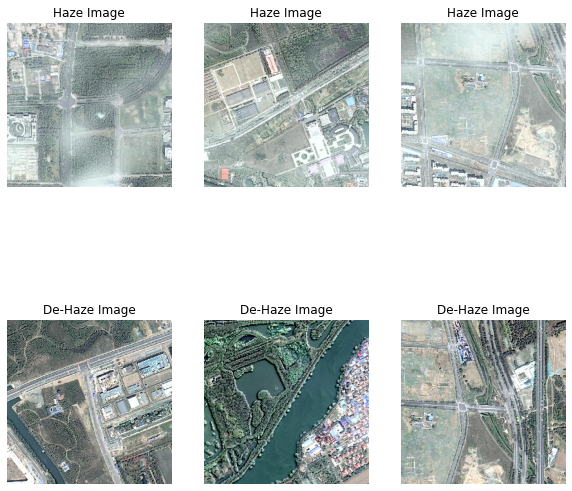

In [4]:
from numpy import load
import matplotlib.pyplot as plt

# Load the dataset
data = load('Haze_DeHaze_256.npz')
dataA_train, dataA_test, dataA_valid, dataB_train, dataB_test, dataB_valid = (
    data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3'], data['arr_4'], data['arr_5']
)
print('Loaded: ', dataA_train.shape, dataA_test.shape, dataA_valid.shape, dataB_train.shape, dataB_test.shape, dataB_valid.shape)

# Plot source images
n_samples = 3
for i in range(n_samples):
    plt.rcParams["figure.figsize"] = (10, 10)
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.title("Haze Image")
    plt.imshow(dataA_train[i].astype('uint8'))

# Plot target images
for i in range(n_samples):
    plt.rcParams["figure.figsize"] = (10, 10)
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.title("De-Haze Image")
    plt.imshow(dataB_train[i].astype('uint8'))

plt.show()

# Reference:
****The CycleGAN model was described by Jun-Yan Zhu, et al. in their 2017 paper titled “Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks.”****

# Discriminator Architecture:
![image.png](attachment:1e34725b-95c3-4748-b406-eebf7dfdb118.png)

In [5]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-wd679kll
  Running command git clone --filter=blob:none -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-wd679kll
  Resolved https://www.github.com/keras-team/keras-contrib.git to commit 3fc5ef709e061416f4bc8a92ca3750c824b5d2b0
  Preparing metadata (setup.py) ... - done
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-py3-none-any.whl size=101077 sha256=a5b7498c7e149dc50be43491dcf6deb1d5d39042bacd8baaf8c7df7d96aca3bb
  Stored in directory: /tmp/pip-ephem-wheel-cache-zw_6owxa/wheels/bb/1f/f2/b57495012683b6b20bbae94a3915ec79753111452d79886abc
Successfully built keras-contrib


In [6]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# define layer
layer = InstanceNormalization(axis=-1)
#The “axis” argument is set to -1 to ensure that features are normalized per feature map.

The define_discriminator() function below implements the 70×70 PatchGAN discriminator model as per the design of the model in the paper. The model takes a 256×256 sized image as input and outputs a patch of predictions. The model is optimized using least squares loss (L2) implemented as mean squared error,and a weighting is used so that the model have half (0.5) the usual effect. The authors of CycleGAN paper recommend this weighting of model updates to slow down changes to the discriminator, relative to the generator model during training.

In [7]:
from random import random
from numpy import load
from numpy import zeros
from numpy import ones
from numpy import asarray
from numpy.random import randint
from tensorflow.keras.optimizers import Adam 
from keras.initializers import RandomNormal
from keras.models import Model
from keras.models import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate,Add
from keras.models import load_model

In [8]:
# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_image = Input(shape=image_shape)
    # C64
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
    d = LeakyReLU(alpha=0.2)(d)
    # C128
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    # define model
    model = Model(in_image, patch_out)
    # compile model
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model

# Generator Architecture:
![image.png](attachment:3a95b23a-137a-4392-b9c3-64f6ceeaa68f.png)

The resnet_block() function that creates two Convolution-InstanceNorm blocks with 3×3 filters and 1×1 stride and without a ReLU activation after the second block.These are blocks comprised of two 3×3 CNN layers where the input to the block is concatenated to the output of the block, channel-wise.

In [9]:
# # generator a resnet block
# def resnet_block(n_filters, input_layer):
#     # weight initialization
#     init = RandomNormal(stddev=0.02)
#     # first layer convolutional layer
#     g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
#     g = InstanceNormalization(axis=-1)(g)
#     g = Activation('relu')(g)
#     # second convolutional layer
#     g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
#     g = InstanceNormalization(axis=-1)(g)
#     # concatenate merge channel-wise with input layer
#     g = Add()([g, input_layer])
#     return g
from tensorflow.keras.layers import Conv2D, Concatenate

def resnet_block(n_filters, input_layer):
    # First convolutional layer
    g = Conv2D(n_filters, (3, 3), padding='same')(input_layer)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # Second convolutional layer
    g = Conv2D(n_filters, (3, 3), padding='same')(g)
    g = InstanceNormalization(axis=-1)(g)
    # Merge with input layer (skip connection)
    g = Concatenate()([g, input_layer])
    return g

The generator is an encoder-decoder model architecture. The model takes a source image (e.g. T1 weighted) and generates a target image (e.g. T2 weighted). First downsampling or encoding the input image down to a bottleneck layer(with reduced dimensionality), then interpreting the encoding with a number of ResNet layers that use skip connections, followed by a series of layers that upsample or decode the representation to the size of the output image.

In [10]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Activation
from tensorflow.keras.initializers import RandomNormal
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.layers import Add

def define_generator(image_shape, n_resnet=9):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # c64
    g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d128-downsample
    g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d256
    g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # R256-ResNet
    for _ in range(n_resnet):
        g = resnet_block(256, g)
    # u128-upsample
    g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # u64
    g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # c3
    g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

****For Generator A:(T1w to T2w)****

* Adversarial Loss: T1w -> GenA -> T2w -> DisA -> [Real,Fake] (L2 or MSE)
* Identity Loss: T2w -> GenA -> T2w (L1 or MAE)
* Forward Cycle Loss: T1w -> GenA -> T2w -> GenB -> T1w_hat (L1 or MAE)
* Backward Cycle Loss: T2w -> GenB -> T1w -> GenA -> T2w_hat (L1 or MAE)

****For Generator B: (T2w to T1w)****

* Adversarial Loss: T2w -> GenB -> T1w -> DisB -> [Real,Fake] (L2 or MSE)
* Identity Loss: T1w -> GenB -> T1w (L1 or MAE)
* Forward Cycle Loss: T2w -> GenB -> T1w -> GenA -> T2w_hat (L1 or MAE)
* Backward Cycle Loss: T1w -> GenA -> T2w -> GenB -> T1w_hat (L1 or MAE)

****define_composite_model() updates the generators based on the above losses mentioned****

In [11]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.optimizers import Adam

def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
    # Ensure the model we're updating is trainable
    g_model_1.trainable = True
    # Mark discriminator as not trainable
    d_model.trainable = False
    # Mark other generator model as not trainable
    g_model_2.trainable = False
    # Discriminator element
    input_gen = Input(shape=image_shape)  # Input 1
    gen1_out = g_model_1(input_gen)  # Input 1 -> g_model_1 -> gen1_out
    output_d = d_model(gen1_out)  # Input 1 -> g_model_1 -> gen1_out -> d_model -> [Real,Fake]
    # Identity element
    input_id = Input(shape=image_shape)  # Input 2
    output_id = g_model_1(input_id)  # Input 2 -> g_model_1 -> output_id
    # Forward cycle
    output_f = g_model_2(gen1_out)  # Input 1 -> g_model_1 -> gen1_out -> g_model_2 -> output_f
    # Backward cycle
    gen2_out = g_model_2(input_id)  # Input 2 -> g_model_2 -> gen2_out
    output_b = g_model_1(gen2_out)  # Input 2 -> g_model_2 -> gen2_out -> g_model_1 -> output_b
    # Define model graph
    model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
    # Define optimization algorithm configuration
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    # Compile model with weighting of least squares loss and L1 loss
    model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
    return model

In [12]:
from numpy import load

def load_real_samples(filename):
    # Load the dataset
    data = load(filename)
    # Unpack arrays
    X1_train, X1_test, X1_valid, X2_train, X2_test, X2_valid = (
        data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3'], data['arr_4'], data['arr_5']
    )
    # Scale from [0,255] to [-1,1]
    X1_train = (X1_train.astype('float32') - 127.5) / 127.5
    X1_test = (X1_test.astype('float32') - 127.5) / 127.5
    X1_valid = (X1_valid.astype('float32') - 127.5) / 127.5
    X2_train = (X2_train.astype('float32') - 127.5) / 127.5
    X2_test = (X2_test.astype('float32') - 127.5) / 127.5
    X2_valid = (X2_valid.astype('float32') - 127.5) / 127.5
    return [X1_train, X1_test, X1_valid], [X2_train, X2_test, X2_valid]

In [13]:
def generate_real_samples(dataset, n_samples, patch_shape):
    # Choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # Retrieve selected images
    X = dataset[ix]
    # Reshape images
    X = X.reshape(-1, 256, 256, 3)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return X, y

In [14]:
# import numpy as np

# def generate_fake_samples(g_model, dataset, patch_shape):
#     # Ensure that each image in the dataset has the correct shape (256, 256, 3)
#     dataset = np.array([image.reshape(256, 256, 3) for image in dataset])
    
#     # generate fake instance
#     X = g_model.predict(dataset)
    
#     # create 'fake' class labels (0)
#     # the shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16,
#     # or a 16x16x1 activation map
#     y = np.zeros((len(X), patch_shape, patch_shape, 1))
#     return X, y
# def generate_fake_samples(g_model, dataset, patch_shape):
#     # Resize images to have dimensions of 256x256 pixels if necessary
#     # Example using TensorFlow and tf.image.resize:
#     import tensorflow as tf
#     dataset_resized = tf.image.resize(dataset, [256, 256])
    
#     # Expand dimension to add the batch dimension
#     dataset_resized_batched = np.expand_dims(dataset_resized, axis=0)
    
#     # Generate fake instance
#     X = g_model.predict(dataset_resized_batched)
    
#     # Rest of the function remains unchanged
#     # Create 'fake' class labels (0)
#     # The shape of the PatchGAN output is also provided, which in the case of 256×256 images will be 16,
#     # or a 16x16x1 activation map
#     y = np.zeros((len(X), patch_shape, patch_shape, 1))

#     return X, y
def generate_fake_samples(g_model, dataset, patch_shape):
    # Generate fake instances
    X = g_model.predict(dataset)
    # Reshape images
    X = X.reshape(-1, 256, 256, 3)
    # Create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [15]:
def select_sample(dataset, shape):
    # choose random instance from the training sample of dataset
    ix = np.random.randint(0, dataset.shape[0], 1)
    # retrieve selected image
    X = dataset[ix]
    # add an additional dimension to the selected image
    X = np.expand_dims(X, axis=0)
    # reshape the image to match the expected shape
    X = np.reshape(X, shape)
    # add an additional dimension to the selected image
    X = np.expand_dims(X, axis=3)
    return X

In [16]:
def save_models(step, g_model_AtoB, g_model_BtoA):
    # Save the first generator model
    filename1 = 'g_model_AtoB_%06d.h5' % (step+1)
    g_model_AtoB.save('/kaggle/working/' + filename1)
    # Save the second generator model
    filename2 = 'g_model_BtoA_%06d.h5' % (step+1)
    g_model_BtoA.save('/kaggle/working/' + filename2)
    print('> Saved: %s and %s' % (filename1, filename2))

To reduce model oscillation, we follow Shrivastava et al.’s strategy and update the discriminators using a history of generated images rather than the ones produced by the latest generators. We keep an image buffer that stores the 50 previously created images.

In [17]:
from numpy import asarray
from numpy.random import randint, random

def update_image_pool(pool, images, max_size=50):
    selected = []
    for image in images:
        if len(pool) < max_size:
            # Stock the pool
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            # Use image, but don't add it to the pool
            selected.append(image)
        else:
            # Replace an existing image and use replaced image
            ix = randint(0, len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return asarray(selected)

In [18]:
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset):
    # Define properties of the training run
    n_epochs, n_batch = 40, 1
    # Determine the output square shape of the discriminator
    n_patch = d_model_A.output_shape[1]
    # Unpack dataset
    trainA, testA, validA = dataset[0]
    trainB, testB, validB = dataset[1]
    poolA, poolB = list(), list()
    # Calculate the number of batches per training epoch
    bat_per_epo = int(min(len(trainA), len(trainB)) / n_batch)
    # Calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    # Manually enumerate epochs
    for i in range(n_steps):
        # Select a batch of real samples
        X_realA, y_realA = generate_real_samples(trainA, n_batch, n_patch)
        X_realB, y_realB = generate_real_samples(trainB, n_batch, n_patch)
        # Generate a batch of fake samples
        X_fakeA, y_fakeA = generate_fake_samples(g_model_BtoA, X_realB, n_patch)
        X_fakeB, y_fakeB = generate_fake_samples(g_model_AtoB, X_realA, n_patch)
        # Update fakes from pool
        X_fakeA = update_image_pool(poolA, X_fakeA)
        X_fakeB = update_image_pool(poolB, X_fakeB)
        # Train discriminator A
        dA_loss1 = d_model_A.train_on_batch(X_realA, y_realA)
        dA_loss2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
        # Train discriminator B
        dB_loss1 = d_model_B.train_on_batch(X_realB, y_realB)
        dB_loss2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)
        # Train the generators
        g_loss1, _, _, _, _ = c_model_AtoB.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
        g_loss2, _, _, _, _ = c_model_BtoA.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
        # Summarize performance
        print('>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1, dA_loss2, dB_loss1, dB_loss2, g_loss1, g_loss2))
        if (i+1) % (bat_per_epo * 1) == 0:
            # Save the models
            save_models(i, g_model_AtoB, g_model_BtoA)

In [19]:
# Load the dataset
dataset_A, dataset_B = load_real_samples('/kaggle/working/Haze_DeHaze_256.npz')

# Unpack dataset for domain A
trainA, testA, validA = dataset_A
# Unpack dataset for domain B
trainB, testB, validB = dataset_B

# Define input shape based on the loaded dataset
print(trainA.shape[1:])
# Generator: A -> B
g_model_AtoB = define_generator(trainA.shape[1:])

# Generator: B -> A
g_model_BtoA = define_generator(trainB.shape[1:])

# Discriminator: A -> [real/fake]
d_model_A = define_discriminator(trainA.shape[1:])

# Discriminator: B -> [real/fake]
d_model_B = define_discriminator(trainB.shape[1:])

# Composite: A -> B -> [real/fake, A]
c_model_AtoB = define_composite_model(g_model_AtoB, d_model_B, g_model_BtoA, trainA.shape[1:])

# Composite: B -> A -> [real/fake, B]
c_model_BtoA = define_composite_model(g_model_BtoA, d_model_A, g_model_AtoB, trainB.shape[1:])

# Train models
train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, [dataset_A, dataset_B])

(256, 256, 3)
>1, dA[2.999,0.738] dB[1.574,1.090] g[19.297,17.758]
>2, dA[9.961,1.891] dB[6.001,1.087] g[24.847,19.115]
>3, dA[2.438,1.079] dB[2.325,1.181] g[19.469,15.295]
>4, dA[2.516,1.175] dB[1.101,1.171] g[17.841,15.135]
>5, dA[0.823,0.940] dB[1.781,1.713] g[17.135,14.212]
>6, dA[0.982,1.184] dB[1.616,2.548] g[18.489,13.548]
>7, dA[0.630,0.968] dB[0.909,1.837] g[17.920,16.276]
>8, dA[1.597,0.684] dB[1.000,1.216] g[12.720,12.439]
>9, dA[1.318,0.866] dB[0.894,0.652] g[12.441,12.729]
>10, dA[1.184,0.866] dB[1.354,1.673] g[23.531,13.350]
>11, dA[0.660,1.274] dB[1.690,0.806] g[11.469,16.272]
>12, dA[0.798,1.412] dB[0.844,1.562] g[22.984,16.028]
>13, dA[1.092,1.748] dB[0.959,1.180] g[16.089,15.514]
>14, dA[1.393,1.434] dB[0.759,1.153] g[13.269,14.756]
>15, dA[1.713,1.429] dB[0.859,1.688] g[14.115,11.182]
>16, dA[1.434,0.796] dB[0.582,1.331] g[15.362,10.009]
>17, dA[1.582,0.853] dB[0.884,1.228] g[17.831,11.114]
>18, dA[0.774,1.136] dB[0.840,1.148] g[14.496,13.170]
>19, dA[0.585,1.078] dB

**From the output, we can infer that the L2 norm is minimized in both the discriminators and the cycle consistency loss is minimized to a descent extent.**

In [20]:
def plt_model(num):
    # load the models
    cust = {'InstanceNormalization': InstanceNormalization}
    model_AtoB = load_model('g_model_AtoB_%06d.h5' % num, custom_objects=cust)
    model_BtoA = load_model('g_model_BtoA_%06d.h5' % num, custom_objects=cust)
    # plot A->B->A
    A_real = select_sample(A_data)
    B_generate  = model_AtoB.predict(A_real)
    A_reconstructed = model_BtoA.predict(B_generate)
    show_plot(A_real, B_generate, A_reconstructed)

In [21]:
import cv2
import os

count = 1

# Load the models from the Kaggle output section
g_model_AtoB = load_model('/kaggle/working/g_model_AtoB_012800.h5')
g_model_BtoA = load_model('/kaggle/working/g_model_BtoA_012800.h5')

X_realA = select_sample(dataset_A[0],(1,) + dataset_A[0][0].shape)
X_realA = X_realA[:, :, :, 0]
print(X_realA.shape)
X_fakeB = g_model_AtoB.predict(X_realA)
print(X_fakeB.shape)
X_fakeA = g_model_BtoA.predict(X_fakeB)
print(X_fakeA.shape)

(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


In [22]:
import math
import numpy as np

def calculate_psnr(img1, img2):
    # img1 and img2 have range [0, 255]
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2)**2)
    if mse == 0:
        return float('inf')
    return 20 * math.log10(255.0 / math.sqrt(mse))

In [23]:
# from keras.models import load_model
# from numpy import load
# from matplotlib import pyplot
# from numpy.random import randint
# from numpy import vstack
 
# # load and prepare training images
# def load_real_samples(filename):
#     # load the dataset
#     data = load(filename)
#     # unpack arrays
#     X1, X2 = data['arr_0'], data['arr_1']
#     # scale from [0,255] to [-1,1]
#     X1 = (X1 - 127.5) / 127.5
#     X2 = (X2 - 127.5) / 127.5
#     return [X1, X2]
 
# # select a random sample of images from the dataset
# def select_sample(dataset):
#     # choose random instances
#     ix = randint(0, dataset.shape[0], 1)
#     # retrieve selected images
#     X = dataset[ix]
#     return X
 
# # plot the image, the translation, and the reconstruction
# def show_plot(imagesX, imagesY1, imagesY2):
#     images = vstack((imagesX, imagesY1, imagesY2))
#     titles = ['Haze Image', 'Dehazed Image', 'Reconstructed Hazed Image']
#     # scale from [-1,1] to [0,1]
#     images = (images + 1) / 2.0
#     # plot images row by row
#     for i in range(len(images)):
#         plt.rcParams["figure.figsize"] = (10,10)
#         # define subplot
#         plt.subplot(1, len(images), 1 + i)
#         # turn off axis
#         plt.axis('off')
#         # plot raw pixel data
#         plt.imshow(images[i])
#         # title
#         plt.title(titles[i])
#     plt.show()
    
# # load dataset
# A_data, B_data = load_real_samples('../input/output-256-haze-dehaze/Haze_DeHaze_256.npz')
# print('Loaded', A_data.shape, B_data.shape)
from keras.models import load_model
from numpy import load
from matplotlib import pyplot as plt
from numpy.random import randint
from numpy import vstack

# load and prepare training images
def load_real_samples(filename):
    # load the dataset
    data = load(filename)
    # unpack arrays
    X1_train, X1_test, X1_valid, X2_train, X2_test, X2_valid = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3'], data['arr_4'], data['arr_5']
    # scale from [0,255] to [-1,1]
    X1_train = (X1_train.astype('float32') - 127.5) / 127.5
    X1_test = (X1_test.astype('float32') - 127.5) / 127.5
    X1_valid = (X1_valid.astype('float32') - 127.5) / 127.5
    X2_train = (X2_train.astype('float32') - 127.5) / 127.5
    X2_test = (X2_test.astype('float32') - 127.5) / 127.5
    X2_valid = (X2_valid.astype('float32') - 127.5) / 127.5
    return [X1_train, X1_test, X1_valid], [X2_train, X2_test, X2_valid]

def select_sample(dataset, shape):
    # choose random instance from the training sample of dataset
    ix = np.random.randint(0, dataset.shape[0], 1)
    # retrieve selected image
    X = dataset[ix]
    # add an additional dimension to the selected image
    X = np.expand_dims(X, axis=0)
    # reshape the image to match the expected shape
    X = np.reshape(X, shape)
    # add an additional dimension to the selected image
    X = np.expand_dims(X, axis=3)
    return X

def show_plot(imagesX, imagesY1, imagesY2):
    num_images = min(imagesX.shape[0], imagesY1.shape[0], imagesY2.shape[0])

    for i in range(num_images):
        fig, axs = plt.subplots(1, 3, figsize=(15, 5), squeeze=False)

        ax = axs[0, 0]
        ax.imshow(imagesX[i])
        ax.axis('off')
        ax.set_title('Haze Image')

        ax = axs[0, 1]
        ax.imshow(imagesY1[i])
        ax.axis('off')
        ax.set_title('Dehazed Image')

        ax = axs[0, 2]
        ax.imshow(imagesY2[i])
        ax.axis('off')
        ax.set_title('Reconstructed Dehazed Image')

        plt.tight_layout()
        plt.show()

dataset_A, dataset_B = load_real_samples('Haze_DeHaze_256.npz')
print('Loaded', dataset_A[0].shape, dataset_B[0].shape)

Loaded (320, 256, 256, 3) (320, 256, 256, 3)


In [24]:
import math
import numpy as np
import cv2

def ssim(img1, img2):
    C1 = (0.01 * 255)**2
    C2 = (0.03 * 255)**2

    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    kernel = cv2.getGaussianKernel(11, 1.5)
    window = np.outer(kernel, kernel.transpose())

    mu1 = cv2.filter2D(img1, -1, window)[5:-5, 5:-5]  # valid
    mu2 = cv2.filter2D(img2, -1, window)[5:-5, 5:-5]
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1 * mu2
    sigma1_sq = cv2.filter2D(img1**2, -1, window)[5:-5, 5:-5] - mu1_sq
    sigma2_sq = cv2.filter2D(img2**2, -1, window)[5:-5, 5:-5] - mu2_sq
    sigma12 = cv2.filter2D(img1 * img2, -1, window)[5:-5, 5:-5] - mu1_mu2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) *
                                                            (sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean()


def calculate_ssim(img1, img2):
    '''calculate SSIM
    the same outputs as MATLAB's
    img1, img2: [0, 255]
    '''
    img1= img1.reshape(256,256,3)
    img2 = img2.reshape(256,256,3)
    if not img1.shape == img2.shape:
        raise ValueError('Input images must have the same dimensions.')
    if img1.ndim == 2:
        return ssim(img1, img2)
    elif img1.ndim == 3:
        if img1.shape[2] == 3:
            ssims = []
            for i in range(3):
                ssims.append(ssim(img1, img2))
            return np.array(ssims).mean()
        elif img1.shape[2] == 1:
            return ssim(np.squeeze(img1), np.squeeze(img2))
    else:
        raise ValueError('Wrong input image dimensions.')

In [25]:
# from skimage import io
# img = io.imread(file_path)

# import cv2
# import glob
# from skimage.transform import rescale, resize, downscale_local_mean
# test_images_hazy = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/test/input'
# test_images_dehazed = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/test/target'
# images = [cv2.imread(file) for file in glob.glob('../input/indoor-outdoor/indoor_outdoor/*.png')]
# images = np.array(images)
# image_resized = np.array([resize(i, (256,256),anti_aliasing=True) for i in images])
# # dataA = load_images(path1)
# # print('Loaded Indoor data: ', dataA.shape)
import cv2
import glob
import os
from skimage.transform import rescale, resize, downscale_local_mean

test_images_hazy = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/test/input'
test_images_dehazed = '/kaggle/input/imagedehazing-isrodataset/SS594_Multispectral_Dehazing/Haze1k/Haze1k/Haze1k_thin/dataset/test/target'

# get a list of file paths for the hazy test images
hazy_file_paths = glob.glob(os.path.join(test_images_hazy, '*.png'))
# read the hazy test images from the file paths
test_images_hazy = [cv2.imread(file) for file in hazy_file_paths]
# convert the hazy test images to a numpy array
test_images_hazy = np.array(test_images_hazy)
# resize the hazy test images to have a shape of (256, 256)
test_images_hazy = np.array([resize(i, (256, 256), anti_aliasing=True) for i in test_images_hazy])
# get a list of file paths for the dehazed test images
dehazed_file_paths = glob.glob(os.path.join(test_images_dehazed, '*.png'))
# read the dehazed test images from the file paths
test_images_dehazed = [cv2.imread(file) for file in dehazed_file_paths]
# convert the dehazed test images to a numpy array
test_images_dehazed = np.array(test_images_dehazed)
# resize the dehazed test images to have a shape of (256, 256)
test_images_dehazed = np.array([resize(i, (256, 256), anti_aliasing=True) for i in test_images_dehazed])

In [26]:
test_images_hazy.shape
#plt.imshow(image_resized)

(45, 256, 256, 3)

(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


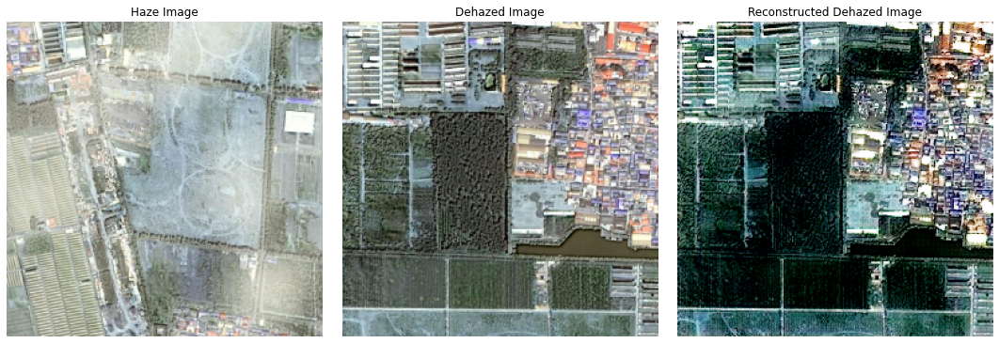

PSNR:  60.329916988811654
SSIM:  0.9917778503006875
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


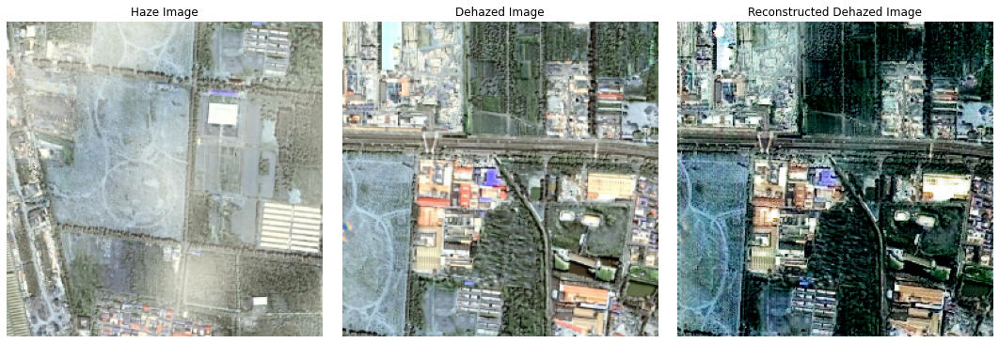

PSNR:  60.19060768425643
SSIM:  0.9915203808919735
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


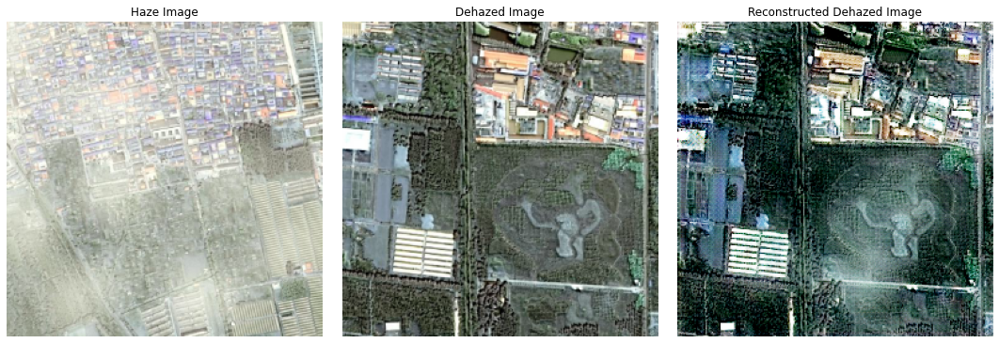

PSNR:  62.83951699776534
SSIM:  0.9960286531542785
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


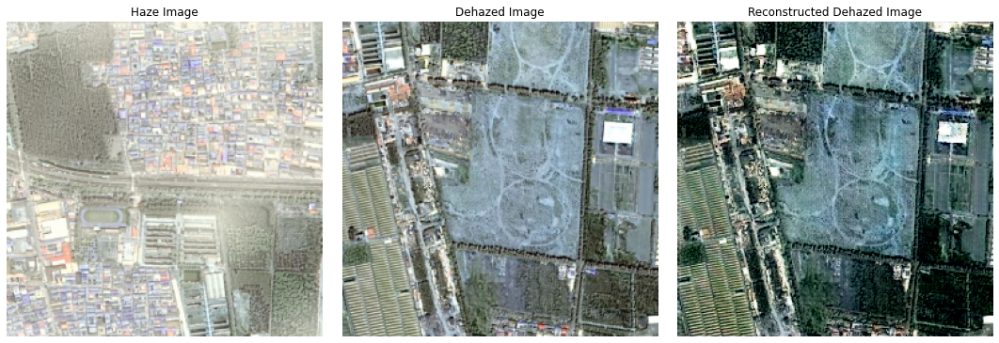

PSNR:  62.27641342391144
SSIM:  0.9949614321772454
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


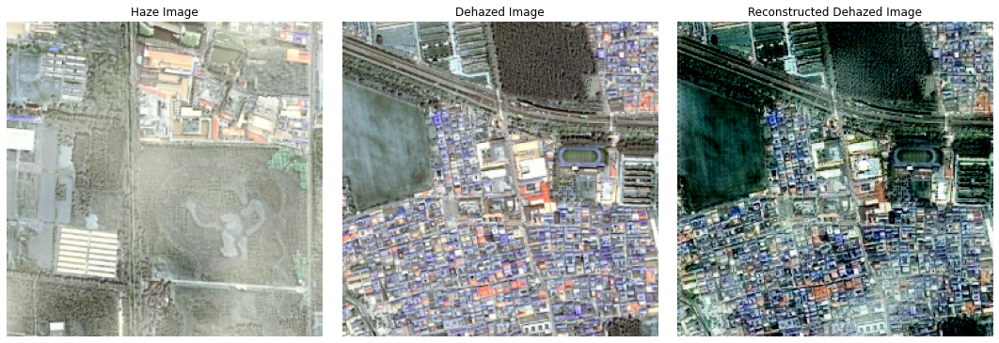

PSNR:  60.2192235499814
SSIM:  0.9917484304634184
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


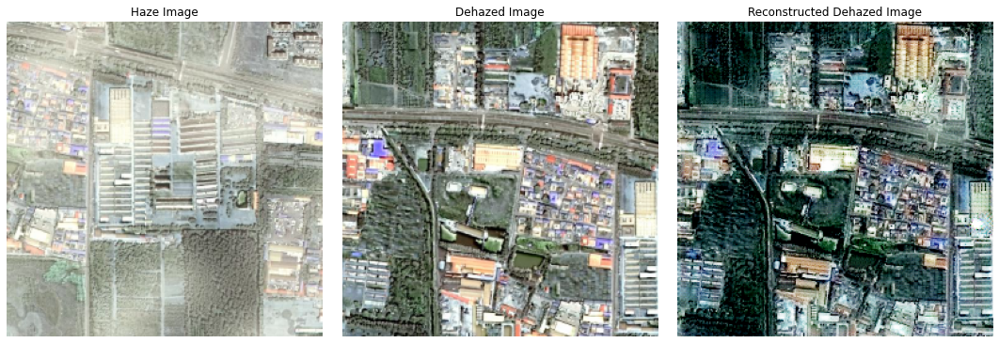

PSNR:  61.05717180946654
SSIM:  0.9931578946975063
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


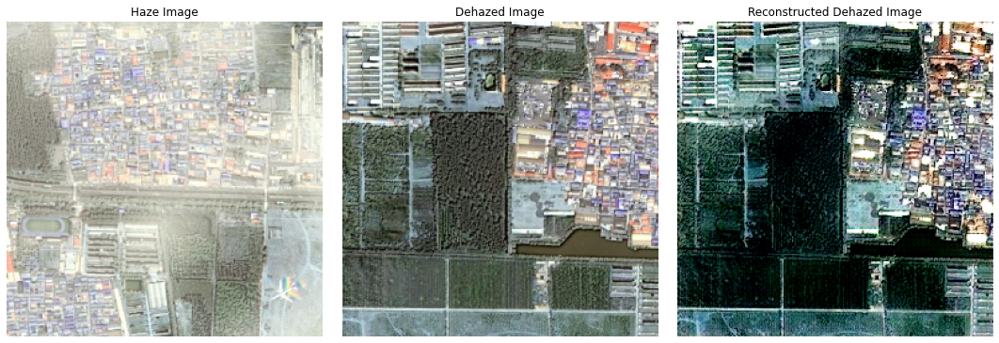

PSNR:  60.3299172884944
SSIM:  0.9917778508900007
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


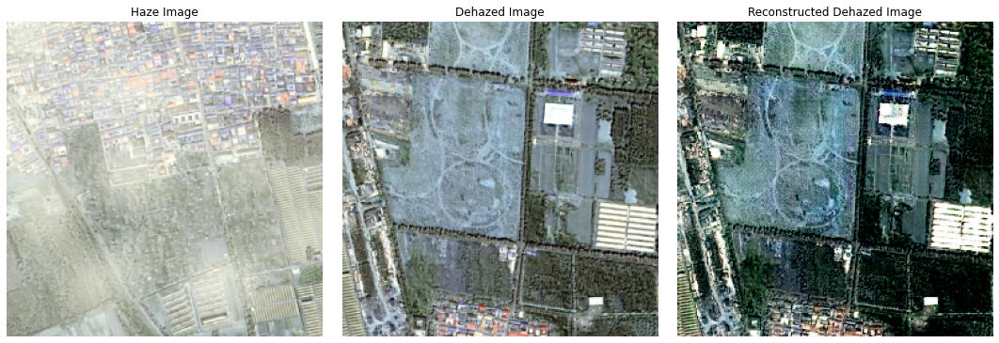

PSNR:  61.04345886103395
SSIM:  0.9934047151910915
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


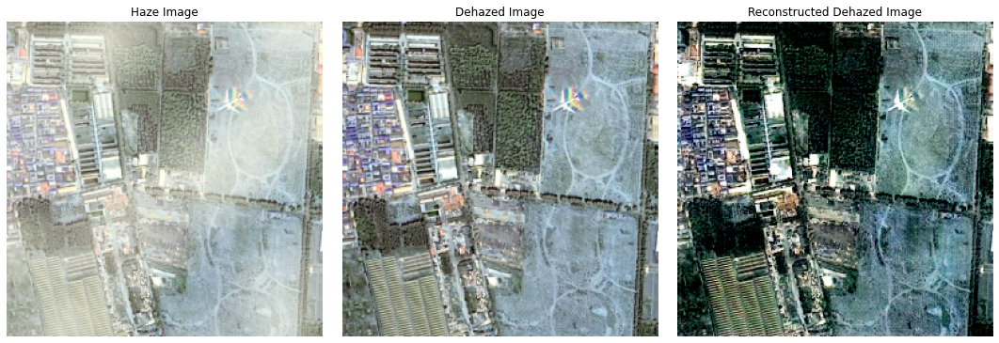

PSNR:  60.20140720716594
SSIM:  0.9918074264539086
(1, 256, 256, 3)
(1, 256, 256, 3)
(1, 256, 256, 3)


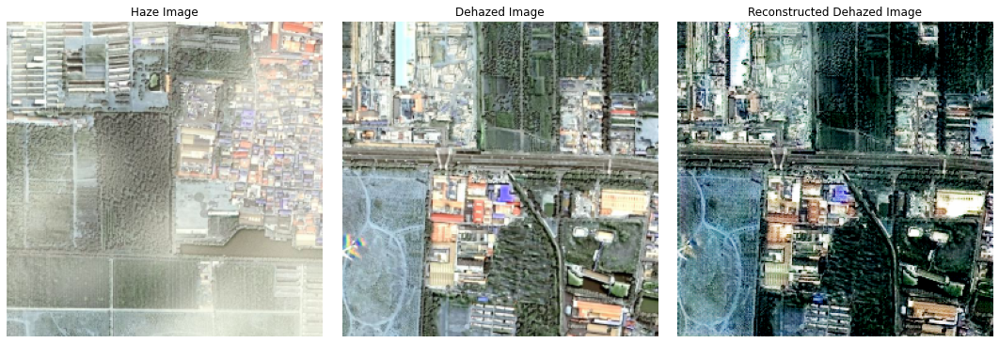

PSNR:  59.97158976394377
SSIM:  0.9911442962869126


In [27]:
PSNR_arr = []
SSIM_arr = []
for i in range(10):
    A_real = select_sample(test_images_hazy, (1,)+test_images_hazy[0].shape)
    i_ = A_real[:, :, :, 0]
    B_real = select_sample(test_images_dehazed, (1,)+test_images_dehazed[0].shape)
    B_real = B_real[:, :, :, 0]
    B_generate  = g_model_AtoB.predict(i_)
    A_reconstructed = g_model_BtoA.predict(B_generate)
    B_reconstructed = g_model_BtoA.predict(B_real) # generate reconstructed dehazed image
    print(B_generate.shape)
    print(A_reconstructed.shape)
    print(B_reconstructed.shape)
    B_real = resize(B_real, B_generate.shape) # resize B_real to have the same shape as B_generate
    show_plot(i_, B_real, B_reconstructed) # show the original hazy image, the dehazed image, and the reconstructed dehazed image
    psnr_val = calculate_psnr(B_real, B_reconstructed) # calculate PSNR between the dehazed image and the reconstructed dehazed image
    ssim_val = calculate_ssim(B_real, B_reconstructed) # calculate SSIM between the dehazed image and the reconstructed dehazed image
    print("PSNR: ",psnr_val)
    print("SSIM: ",ssim_val)
    PSNR_arr.append(psnr_val)
    SSIM_arr.append(ssim_val)

In [28]:
import pandas as pd
psnr_ssim_df=pd.DataFrame({'PSNR':PSNR_arr,'SSIM':SSIM_arr})

In [29]:

psnr_ssim_df

,PSNR,SSIM
0,60.329917,0.991778
1,60.190608,0.991520
2,62.839517,0.996029
3,62.276413,0.994961
4,60.219224,0.991748
5,61.057172,0.993158
6,60.329917,0.991778
7,61.043459,0.993405
8,60.201407,0.991807
9,59.971590,0.991144


In [30]:
print("Peak Signal-to-Noise Ratio: ",np.mean(PSNR_arr))
print("Structural Similarity Index Measure: ",np.mean(SSIM_arr))

Peak Signal-to-Noise Ratio:  60.8459223574831
Structural Similarity Index Measure:  0.9927328930507023
